<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
!pip install ydata_profiling
!pip install phik

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport

random.seed(42)
np.random.seed(42)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Мы фиксируем сиды, чтобы все результаты были воспроизводимы, т.к. их получение обычно связано с рандомом

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [135]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

**Ваш ответ здесь.**

In [4]:
print("Null values in train data:")
print(df_train.isnull().sum())

Null values in train data:
name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64


In [5]:
print("Null values in test data:")
print(df_test.isnull().sum())

Null values in test data:
name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64


In [6]:
print(f"Duplicates in train data: {df_train.duplicated(keep=False).sum()}")

Duplicates in train data: 1478


In [7]:
print(f"Duplicates in test data: {df_test.duplicated(keep=False).sum()}")

Duplicates in test data: 95


In [8]:
train_report = ProfileReport(df_train)
test_report = ProfileReport(df_test)

In [9]:
train_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 23.13it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
test_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 17.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Вывод:
Сразу, что бросается в глаза - это то, что авто-репорт и pandas похоже считают
дубликаты по разному, видим, что в репорте количество дубликатов почти втрое меньше. В целом у нас около 7% дубликатов на train согласно репорту и 21% согласно padnas, на тесте 3% из репорта и около 9% из pandas. Видно, что у признаков mileage, engine, max_power, torque, seats 2-3% пропущенных значений.
Также можем заметить, что немало признаков сильно коррелируют друг с другом. Отчетлива видна связь между мощностью двигателя и видом топлива, коробки передач, ценой. Также есть зависимость между пробегом автомобиля и годом, ценой продажи. Но все эти зависимости довольно логичны, так что каких-то аномалий не видно. Дополнительно можно обратить внимание на то, что например признаки max_power, mileage - текстовые, хотя было бы логичней, если бы они были числовыми.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [11]:
print("Stats for numeric features in train data:")
display(df_train.describe(include=[int, float]))

Stats for numeric features in train data:


,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [12]:
print("Stats for numeric features in test data:")
display(df_test.describe(include=[int, float]))

Stats for numeric features in test data:


,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [13]:
print("Stats for categorical features in train data:")
display(df_train.describe(include=[object]))

Stats for categorical features in train data:


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


In [14]:
print("Stats for categorical features in test data:")
display(df_test.describe(include=[object]))

Stats for categorical features in test data:


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


## Вывод:
Что касается std и median, то на мой взгляд разница между обучающей и тестовой выборкой довольно небольшие, что хорошо для модели. Для признака year могут быть выбросы в виде старых машин, основная масса распределена в 2011-2017 году по 25 и 75 перцентилю. Также видны выбросы, большое стандартное отклонение для полей selling_price и km_driven. Если с ценой можно представить еще, что они могут так разниться, то вот километраж в 2.3 млн. км уже звучит очень странно(что за зверь эта машина). По категориальным признакам можно отметить большую вариативность значений у поля name.

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [15]:
train_features = df_train.drop(columns=['selling_price'])
duplicates = train_features.duplicated(keep=False)
print(f"Duplicate without target: {duplicates.sum()}")

Duplicate without target: 1799


In [16]:
print("Duplicates:")
train_features_cols = train_features.columns.tolist()
display(df_train[duplicates].sort_values(by=train_features_cols))

Duplicates:


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
1836,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
117,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5637,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5652,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5753,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5991,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0


In [123]:
df_train = df_train.drop_duplicates(subset=train_features_cols, keep='first').reset_index(drop=True)

In [124]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [19]:
import re

def clean_torque(torque) -> pd.Series:
    if not isinstance(torque, str):
      return pd.Series([None, None])

    torque = torque.lower()
    torque = torque.replace(',', '')
    torque = torque.replace('at', '@')

    numeric_regex = r'[\d\.]+'
    nums_result = re.findall(numeric_regex, torque)

    if len(nums_result) < 1:
      return pd.Series([None, None])

    torque_num = None
    rpm_num = None

    if len(nums_result) == 1:
      if re.search(r'rpm', torque):
        rpm_num = float(nums_result[0])
      else:
        torque_num = float(nums_result[0])
    elif len(nums_result) == 2:
      torque_num = float(nums_result[0])
      rpm_num = float(nums_result[1])
    else:
      torque_num = float(nums_result[0])
      deviation_regex = r'\d\+\/-\d'

      if re.search(deviation_regex, torque):
        rpm_num = float(nums_result[1]) + float(nums_result[2])
      else:
        rpm_num = float(nums_result[2])

    if re.search(r'kgm', torque) and torque_num is not None:
      torque_num *= 9.8

    return pd.Series([torque_num, rpm_num])

In [20]:
def clean_features_content(df: pd.DataFrame) -> pd.DataFrame:
    FIELDS_TO_CLEAN = {'mileage': [' kmpl', ' km/kg'],
                       'engine': [' cc'],
                       'max_power': [' bhp']}

    df = df.copy()

    for col in FIELDS_TO_CLEAN.keys():
        df[col] = df[col].astype(str).str.lower()

        for field in FIELDS_TO_CLEAN[col]:
            df[col] = df[col].str.replace(field, '', regex=False)

        df[col] = df[col].replace(['nan', ''], None).astype(float)

    df[['torque', 'max_torque_rpm']] = df['torque'].apply(clean_torque).replace(['nan', ''], None)

    return df

Проверим, что после препроцессинга, у нас осталось столько же NaN значений в обработанных столбцах и мы не потеряли информацию:

In [21]:
print('Amount of null values before clean up(train):')
display(df_train[['mileage', 'engine', 'max_power', 'torque']].isnull().sum())

print('\nAmount of null values after clean up(train):')
clean_features_content(df_train)[['mileage', 'engine', 'max_power', 'torque']].isnull().sum()

Amount of null values before clean up(train):


,0
mileage,186
engine,186
max_power,183
torque,187



Amount of null values after clean up(train):


,0
mileage,186
engine,186
max_power,184
torque,187


In [22]:
print('Amount of null values before clean up(test):')
display(df_test[['mileage', 'engine', 'max_power', 'torque']].isnull().sum())

print('\nAmount of null values after clean up(test):')
clean_features_content(df_test)[['mileage', 'engine', 'max_power', 'torque']].isnull().sum()

Amount of null values before clean up(test):


,0
mileage,19
engine,19
max_power,19
torque,19



Amount of null values after clean up(test):


,0
mileage,19
engine,19
max_power,19
torque,19


Видим, что стало на 1 NaN больше в столбце max_power для train. Посмотрим, что лежало в оригинальной таблице:

In [23]:
mask_power = (
    df_train['max_power'].notna() &
    clean_features_content(df_train)['max_power'].isna()
)

df_train.loc[mask_power, ['max_power']]

,max_power
3586,bhp


Убрали плохие данные, так что все хорошо. Обновим таблички:

In [24]:
df_train = clean_features_content(df_train)
df_test = clean_features_content(df_test)

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






## Ответ:
Сразу отвечу на все вопросики. Лучше брать медиану, а не среднее, потому что в наших данных мы видели выбросы и среднее может сильно смещаться в их сторону, давая нереалистичные значения по итогу. Медиану лучше брать из тренировочных данных для обеих выборок, потому что в противном случае у нас будет утечка данных и модель переобучится.

In [25]:
cols_to_fill = ['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']
medians = df_train[cols_to_fill].median()

df_train[cols_to_fill] = df_train[cols_to_fill].fillna(medians)
df_test[cols_to_fill] = df_test[cols_to_fill].fillna(medians)

Проверим, что больше не осталось пустых значений:

In [26]:
display(df_train.isnull().sum())

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


In [27]:
display(df_test.isnull().sum())

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [28]:
df_train['engine'] = df_train['engine'].astype(int)
df_test['engine'] = df_test['engine'].astype(int)

df_train['seats'] = df_train['seats'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

## Ответ:
У нас довольно немного разных значений для этого поля + поле можем использовать, как оценивающую характеристику, а не просто какое-то числовое значение. То есть, например 2 места - двухместный спортивный автомобиль, 4-5 мест - семейное авто, для 6-8 можем говорить, что это скорее всего минивэн и т.д.


### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [29]:
print("Stats for numeric features in train data:")
display(df_train.describe(include=[int, float]))

Stats for numeric features in train data:


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,175.919680,5.426712,3046.645205
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,116.714313,0.982344,912.076209
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,47.040000,2.000000,1400.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,111.800000,5.000000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.000000,5.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,3724.000000,14.000000,21800.000000


In [30]:
print("Stats for numeric features in test data:")
display(df_test.describe(include=[int, float]))

Stats for numeric features in test data:


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,177.608530,5.403000,3099.776000
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,103.711762,0.912921,878.545644
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,48.000000,4.000000,1500.000000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,111.700000,5.000000,2500.000000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,160.000000,5.000000,3000.000000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,205.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,1421.000000,9.000000,5200.000000


## Ответ:
Сравнивая таблицы, действительно можно заметить, что значения mean и std для некоторых полей изменились. Но заполнение пропуском медианной могло лишь незначительно сместить распределение. На деле же, почти наверняка значения поменялись из-за удаления дубликатов.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

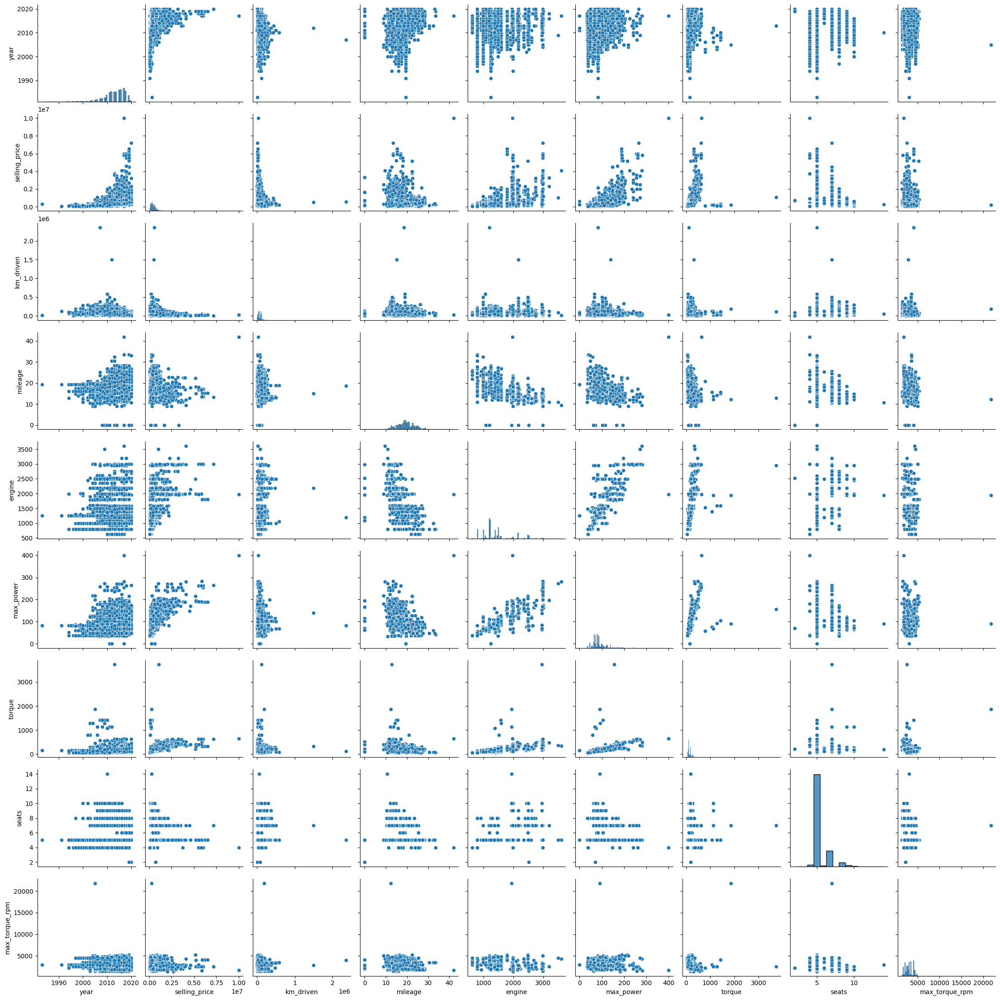

In [31]:
sns.pairplot(df_train)

plt.show()

## Ответ:
Да, по графикам можем оценить связи признаков с целевой переменной:
- Больше мощность двигателя - выше цена
- Меньше пробег - выше цена
- Позже год выпуска - выше цена
- Больше объем двигателя - выше цена(на графике не очень явно)

Хоть графики и не подтверждают корреляцию, но гипотезу мы выдвинуть вполне можем. На большинстве графиков немало шума и явных связей не видно, но из заметных отмечу следующие:
- year - max_power: положительная корреляция(новые машины с мощными двигателями)
- mileage - max_power, engine: отрицательная корреляция (у машин с мощным двигателем меньше пробег)
- engine - max_power - torque: положительная корреляция(больший объем двигателя - большая мощность - больший крутящий момент)



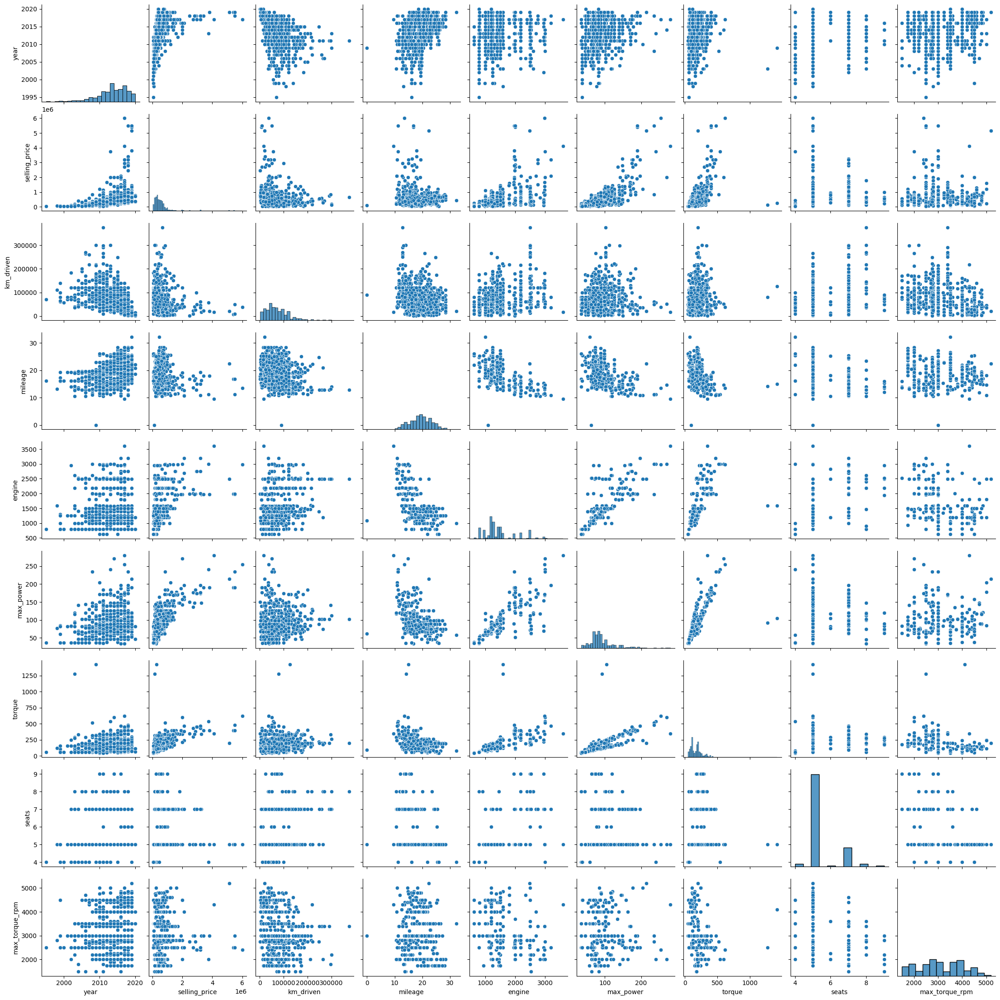

In [32]:
sns.pairplot(df_test)

plt.show()

## Ответ:
В целом структура распределений для обучающей и тестовой выборки схожи. У некоторых признаков она немного отличается, но это скорее всего объясняется разным объемом данных.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

<Axes: >

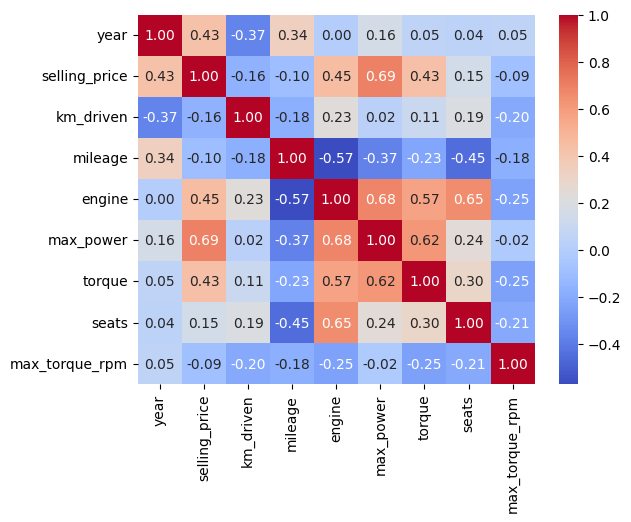

In [33]:
sns.heatmap(df_train.select_dtypes(include=[int, float]).corr(), annot=True, fmt=".2f", cmap="coolwarm")

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

## Ответ:
- Наименее скоррелированные признаки - это engine и year. Значение корреляции около 0.
- Сильная связь наблюдается между признаками engine - mileage и engine - max_power, torque, seats.
- В целом да, верно, т.к. у нас наблюдается отрицательная корреляция между признаками, т.е. чем позже год выпуска, тем меньше пробег.
- Всего у метода корреляции есть 3 опции: корреляция Пирсона, Спирмена и Кендалла. По умолчанию в pd.corr() используется корреляция Пирсона.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [34]:
def get_spearman_rank(x: pd.Series) -> np.array:
    x = np.array(x)

    temp = x.argsort()
    ranks = np.empty_like(temp, dtype=float)
    ranks[temp] = np.arange(len(x))

    _, inv, counts = np.unique(x, return_inverse=True, return_counts=True)
    for c in np.where(counts > 1)[0]:
        idx = np.where(inv == c)[0]
        ranks[idx] = ranks[idx].mean()

    return ranks

def _spearman_corr(x: pd.Series, y: pd.Series) -> float:
    rx = get_spearman_rank(x)
    ry = get_spearman_rank(y)

    rx -= rx.mean()
    ry -= ry.mean()

    return np.sum(rx * ry) / np.sqrt(np.sum(rx ** 2) * np.sum(ry ** 2))

def spearman_corr(df: pd.DataFrame) -> pd.DataFrame:
    numeric_df = df.select_dtypes(include=[int, float])
    cols = numeric_df.columns
    n = len(cols)

    corr = np.zeros((n, n))

    for i in range(n):
        for j in range(n):
            corr[i, j] = _spearman_corr(
                numeric_df.iloc[:, i].values,
                numeric_df.iloc[:, j].values
            )

    return pd.DataFrame(corr, columns=cols)

<Axes: >

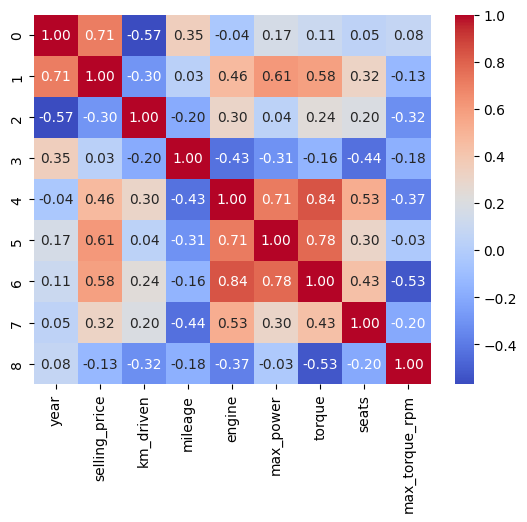

In [35]:
sns.heatmap(spearman_corr(df_train), annot=True, fmt=".2f", cmap="coolwarm")

Сравним с результатами корреляции Спирмена в Pandas:

<Axes: >

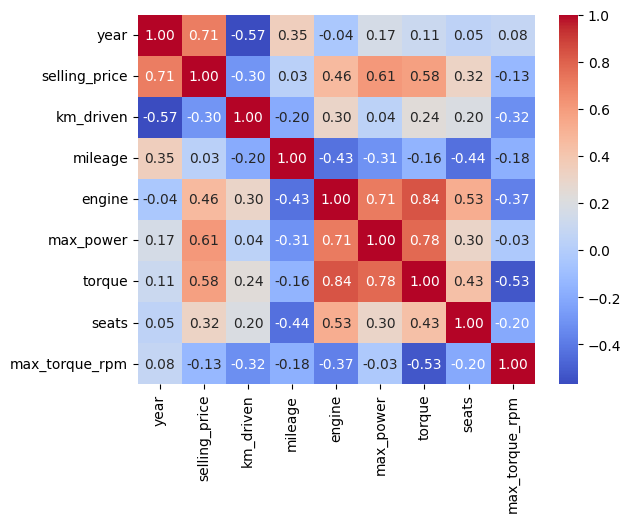

In [36]:
sns.heatmap(df_train.select_dtypes(include=[int, float]).corr(method='spearman'), annot=True, fmt=".2f", cmap="coolwarm")

Видно, что значения корреляций совпадают. К тому же можно заметить, что некоторые корреляции, которые мы видели в корреляции Пирсона стали мощнее, а какие-то наоборот снизились. Корреляция Спирмена позволяет нам находить нелинейные зависимости между признаками.

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/usr/local/lib/python3.12/dist-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


<Axes: >

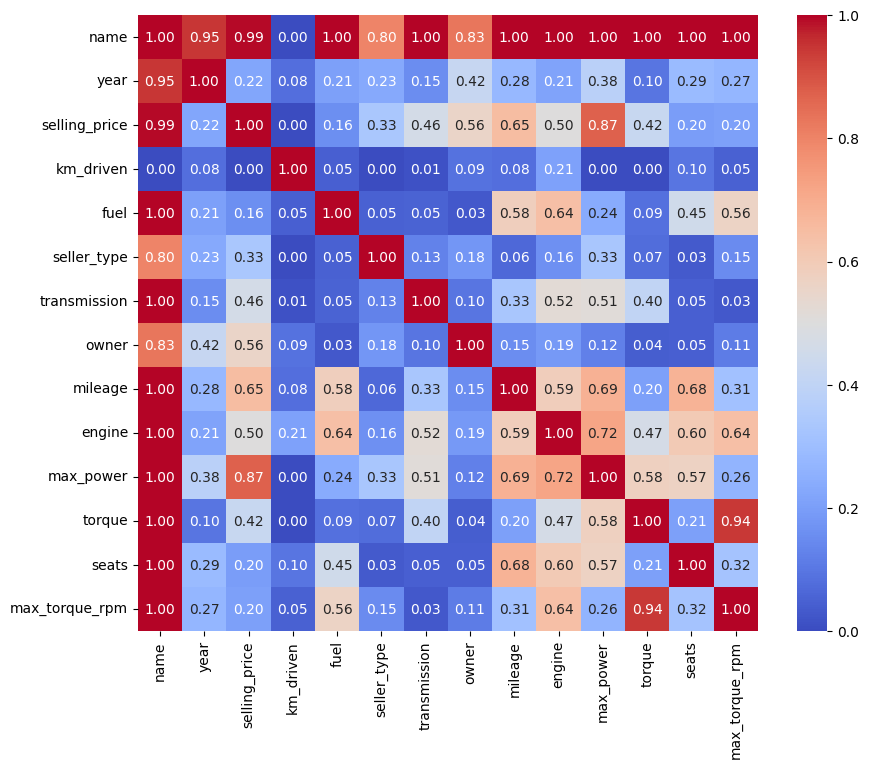

In [37]:
from phik import phik_matrix

plt.figure(figsize=(10, 8))
sns.heatmap(df_train.phik_matrix(), annot=True, fmt=".2f", cmap="coolwarm")

С Phik корреляцией у нас появилась возможность считать зависимости между числовыми и категориальными признаками. Огромная корреляция между признаком name и почти всеми прочими. Также, например, есть зависимость между видом топлива и объемом двигателя и mileage, типом коробки передач и объемом, мощностью двигателя и т.д.

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

Для более глубокого анализа связи категориальных признаков и целевой переменной можно построить скрипичные графики, которые дадут нам лучшее понимание о характере распределения в каждой из категорий, выбросах, квантилях.

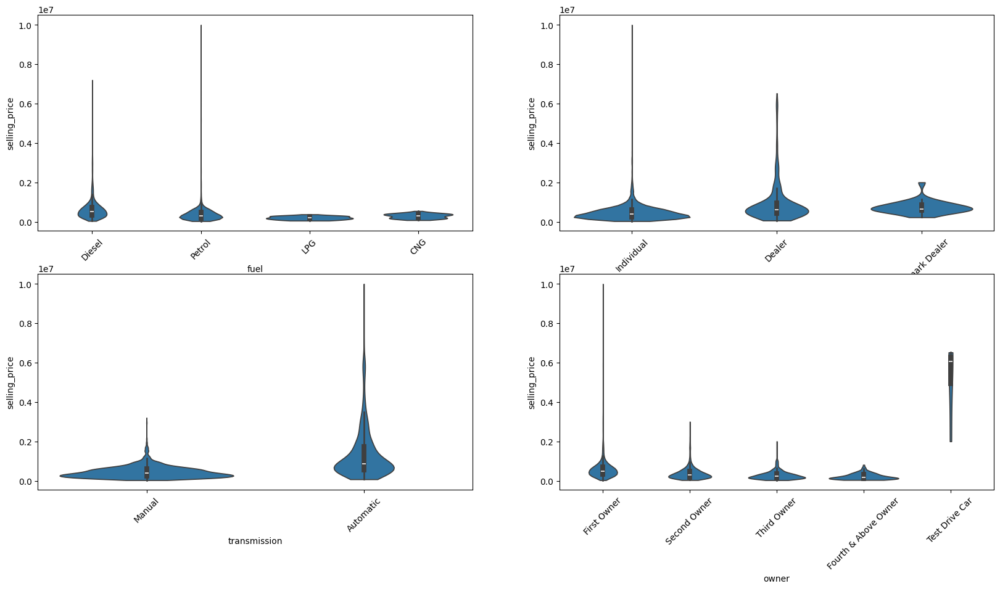

In [38]:
cat_features = df_train.select_dtypes(exclude=[int, float]).columns.tolist()
cat_features.remove('name')
n = len(cat_features)
fig, axes = plt.subplots(
    nrows=(n + 1) // 2,
    ncols=2,
    figsize=(20, 5 * ((n + 1) // 2))
)
axes = axes.flatten()

for ax, col in zip(axes, cat_features):
    sns.violinplot(
        data=df_train,
        x=col,
        y='selling_price',
        ax=ax,
        cut=0
    )
    ax.tick_params(axis='x', rotation=45)

plt.show()

## Выводы:
В целом можно видеть, что почти у всех признаков межквантильный интервал довольно небольшой, только у автоматической коробки передач он довольно вытянут. У почти половины категорий можно увидеть довольно длинный верхний хвост, то есть в них у нас наблюдаются сильные выбросы, которые надо иметь в виду. Довольно необычно по сравнению с другими выглядит график категории Test drive car(owner). Исходя из графика можно сказать, что такая категория довольно редкая, потому что у нас нет "боков" у скрипки, описывающие частоту значений в распределении. А так почти у всех признаков можем наблюдать нормальное распределение у части из которых оно смещено вниз.

Теперь построим дополнительные графики распределения для числовых признаков и оценим насколько формы распределения для train и test схожи друг с другом для них.

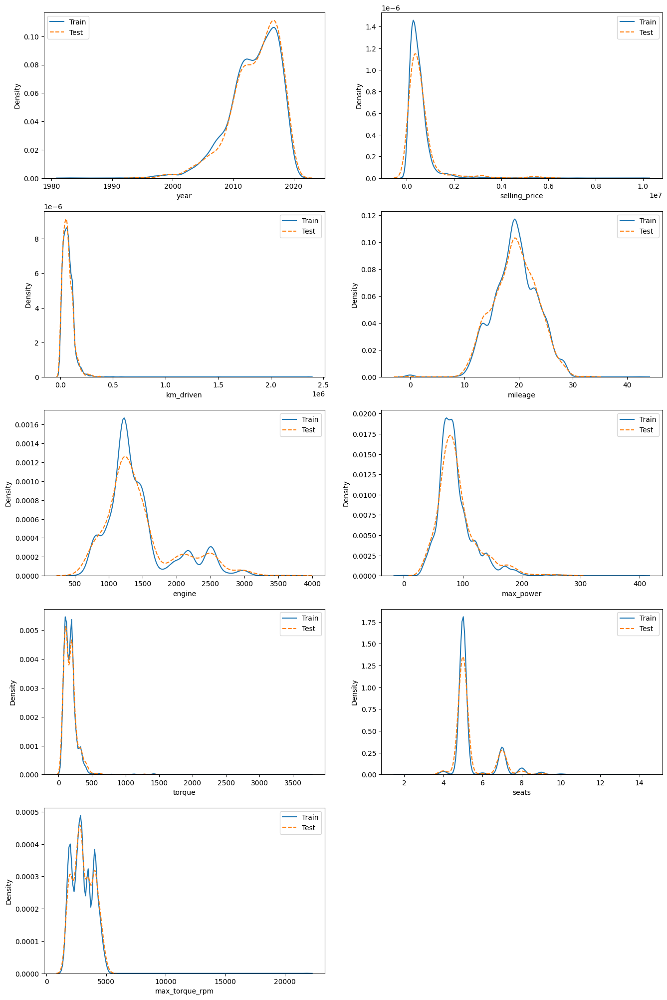

In [39]:
numeric_features = df_train.select_dtypes(include=[int, float]).columns.tolist()
n = len(numeric_features)
fig, axes = plt.subplots(
    nrows=(n + 1) // 2,
    ncols=2,
    figsize=(16, 5 * ((n + 1) // 2))
)

axes = axes.flatten()

for ax, col in zip(axes, numeric_features):
    sns.kdeplot(
        df_train[col],
        ax=ax,
        label='Train',
    )
    sns.kdeplot(
        df_test[col],
        ax=ax,
        label='Test',
        linestyle='--'
    )
    ax.legend()

for i in range(len(numeric_features), len(axes)):
    fig.delaxes(axes[i])

plt.show()

## Вывод:
На графиках видно, что формы почти всех графиков для train и test совпадают, что хорошо для обучения модели, поскольку данные имеют схожую структуру и будет меньше шансов, что мы переобучимся. В некоторых случаях графики немного разнятся, но как уже обсуждали выше, это скорее всего из-за недостатка данных в тестовой выборке, будь их больше данные скорее всего были бы еще больше похожими.

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [40]:
df_train_numeric = df_train.select_dtypes(include=[int, float])
df_test_numeric = df_test.select_dtypes(include=[int, float])

In [41]:
y_train = df_train_numeric['selling_price']
X_train = df_train_numeric.drop(columns=['selling_price'])

In [42]:
y_test = df_test_numeric['selling_price']
X_test = df_test_numeric.drop(columns=['selling_price'])

In [43]:
X_train.head(3)

,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
0,2014,145500,23.40,1248,74.00,190.00,5,2000.0
1,2014,120000,21.14,1498,103.52,250.00,5,2500.0
2,2010,127000,23.00,1396,90.00,219.52,5,2750.0


In [44]:
y_train.head(3)

,selling_price
0,450000
1,370000
2,225000


### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [45]:
def print_statistics(y_train: pd.Series, y_test: pd.Series,
                     y_train_pred: np.array, y_test_pred: np.array):
  results = {
      'Train R2': R2(y_train, y_train_pred),
      'Test R2': R2(y_test, y_test_pred),
      'Train MSE': MSE(y_train, y_train_pred),
      'Test MSE': MSE(y_test, y_test_pred),
  }

  for metric, result in results.items():
      print(f'{metric}: {result:.3f}')

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score as R2, mean_squared_error as MSE

LR_model = LinearRegression()
LR_model.fit(X_train, y_train)

y_train_pred = LR_model.predict(X_train)
y_test_pred = LR_model.predict(X_test)

print_statistics(y_train, y_test, y_train_pred, y_test_pred)

Train R2: 0.601
Test R2: 0.600
Train MSE: 114368860490.125
Test MSE: 229727384170.967


## Вывод:
Для простой LR получили не прямо плохой результат, R2 ~ 0.6 и на обеих выборках говорит, о том, что мы не переобучились и уже верно описываем более половины тестовой выборки. MSE получился довольно большим, что трудно для восприятия. Train MSE < Test MSE, но они имеют один порядок, так что такое отклонение в пределах допустимого.

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

## Пояснение
Формула $R^2$:

$R^2 = 1 - \frac{\sum_{i=1}^{n}(y_i - \hat y_i)^2} {\sum_{i=1}^{n}(y_i - \bar y_i)^2}$, где

$y_i$ - значение целевой переменной,
$\hat y_i$ - предсказание целевой переменной моделью,
$\bar y_i$ - среднее значение целевой переменной

In [47]:
def r2_score_manual(y_true: pd.Series, y_pred: pd.Series) -> float:
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    y_mean = y_true.mean()

    return 1 - np.sum((y_true - y_pred) ** 2) / np.sum((y_true - y_mean) ** 2)

In [48]:
print(f"Manual R2:   {r2_score_manual(y_test, y_test_pred):.3f}")
print(f"Sklearn R2:  {R2(y_test, y_test_pred):.3f}")

Manual R2:   0.600
Sklearn R2:  0.600


### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

## Пояснение:
Формула Adjusted-$R^2$:

Adjusted-$R^2 = 1 - (1- R^2) \frac{n-1}{n-p-1}$, где

$R^2$ - обычное значение метркии $R^2$,
$n$ - число наблюдений
$p$ - число признаков

Adjusted-$R^2$ используется, когда мы хотим сравнить разные модели с разным кол-вом признаков. Также может использоваться для отсеивания ненужных признаков и обнаружения переобучения.

In [49]:
def adjusted_r2_score_manual(y_true: pd.Series, y_pred: pd.Series, p: int) -> float:
    r2 = r2_score_manual(y_true, y_pred)

    n = len(y_true)

    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [50]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

LR_model_scaled = LinearRegression()
LR_model_scaled.fit(X_train_scaled, y_train)

y_train_pred = LR_model_scaled.predict(X_train_scaled)
y_test_pred = LR_model_scaled.predict(X_test_scaled)

print_statistics(y_train, y_test, y_train_pred, y_test_pred)

Train R2: 0.601
Test R2: 0.600
Train MSE: 114368860490.125
Test MSE: 229727384170.967


Метрики не выросли после стандартизации

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [51]:
coef = pd.Series(
    LR_model_scaled.coef_,
    index=X_train.columns
)
coef.abs().sort_values(ascending=False)

,0
max_power,330692.875933
year,165335.405898
max_torque_rpm,59222.961031
km_driven,48944.373508
seats,30161.794476
engine,23141.902215
mileage,7875.820716
torque,4684.186000


## Ответ:
Самым важным признаком для прогнозирования цены оказался max_power.

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [52]:
from sklearn.linear_model import Lasso

lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

y_train_pred = lasso.predict(X_train_scaled)
y_test_pred = lasso.predict(X_test_scaled)

print_statistics(y_train, y_test, y_train_pred, y_test_pred)

Train R2: 0.601
Test R2: 0.600
Train MSE: 114368860503.741
Test MSE: 229728120579.691


In [53]:
coef = pd.Series(
    lasso.coef_,
    index=X_train.columns
)
coef.abs().sort_values(ascending=False)

,0
max_power,330694.249064
year,165333.210910
max_torque_rpm,59220.870973
km_driven,48943.430617
seats,30157.816042
engine,23139.896775
mileage,7872.542075
torque,4683.552040


## Вывод:
Качество с Lasso регуляризацией не изменилось, глядя на коэффициенты для Lasso по умолчанию видим, что они стали иными, однако ни один из весов не занулился. Это может быть по нескольким причинам:
- Все признаки важны и регуляризация не занулила их
- Значение alpha по-умолчанию слишком маленькое и регуляризация слабо штрафует признаки.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [54]:
from sklearn.model_selection import GridSearchCV

grid_search_params = {
    'alpha': np.logspace(-6, 3, 30),
    'max_iter': np.linspace(500, 10000, 5).astype(int),
    'tol': np.logspace(-6, -1, 5),
}


grid_lasso = GridSearchCV(
    estimator=lasso,
    param_grid=grid_search_params,
    cv=10,
    scoring='r2',
    n_jobs=4
)

grid_lasso.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=Lasso(), n_jobs=4,
             param_grid={'alpha': array([1.00000000e-06, 2.04335972e-06, 4.17531894e-06, 8.53167852e-06,
       1.74332882e-05, 3.56224789e-05, 7.27895384e-05, 1.48735211e-04,
       3.03919538e-04, 6.21016942e-04, 1.26896100e-03, 2.59294380e-03,
       5.29831691e-03, 1.08263673e-02, 2.21221629e-02, 4.52035366e-02,
       9.23670857e-02, 1.88739182e-01, 3.85662042e-01, 7.88046282e-01,
       1.61026203e+00, 3.29034456e+00, 6.72335754e+00, 1.37382380e+01,
       2.80721620e+01, 5.73615251e+01, 1.17210230e+02, 2.39502662e+02,
       4.89390092e+02, 1.00000000e+03]),
                         'max_iter': array([  500,  2875,  5250,  7625, 10000]),
                         'tol': array([1.00000000e-06, 1.77827941e-05, 3.16227766e-04, 5.62341325e-03,
       1.00000000e-01])},
             scoring='r2')

In [55]:
best_lasso_model = grid_lasso.best_estimator_

print(f'Models count: {len(grid_search_params['alpha']) * len(grid_search_params['max_iter']) * len(grid_search_params['tol']) * 10}')

print('Best model params:')
print(best_lasso_model.get_params())

y_train_pred = best_lasso_model.predict(X_train_scaled)
y_test_pred = best_lasso_model.predict(X_test_scaled)

print_statistics(y_train, y_test, y_train_pred, y_test_pred)

Models count: 7500
Best model params:
{'alpha': np.float64(1000.0), 'copy_X': True, 'fit_intercept': True, 'max_iter': np.int64(500), 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': np.float64(1e-06), 'warm_start': False}
Train R2: 0.601
Test R2: 0.599
Train MSE: 114382754926.388
Test MSE: 230477503008.854


In [56]:
coef = pd.Series(
    best_lasso_model.coef_,
    index=X_train.columns
)
coef.abs().sort_values(ascending=False)

,0
max_power,332054.502022
year,163070.906686
max_torque_rpm,57084.452936
km_driven,48019.334714
seats,26172.505513
engine,21242.856372
mileage,4475.471532
torque,4045.013301


## Ответ:
Grid Search обучил 7500 моделей: 30 (alpha) * 5 (max_iter) * 5(tol) * 10 (количество фолдов). Среди параметров Grid Search:
 - alpha - коэффициент регуляризации
 - max_iter - максимальное количество итераций обучения модели
 - tol - точность, на которую как минимум должен отличаться результат модели на прошлой итерации по сравнению к текущему для продолжения обучения. В противном случае, если изменения меньше tol, то обучение досрочно остановится. Лучшим коэффициентом оказалось alpha = 1000, никакие из параметров не занулились.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [57]:
from sklearn.linear_model import ElasticNet

elastic = ElasticNet()

grid_search_params = {
    'alpha': np.logspace(-6, 3, 30),
    'l1_ratio': np.linspace(0.1, 0.9, 9),
    'max_iter': np.linspace(500, 10000, 5).astype(int),
    'tol': np.logspace(-6, -1, 5),
}


grid_elastic = GridSearchCV(
    estimator=elastic,
    param_grid=grid_search_params,
    cv=10,
    scoring='r2',
    n_jobs=4
)

grid_elastic.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=ElasticNet(), n_jobs=4,
             param_grid={'alpha': array([1.00000000e-06, 2.04335972e-06, 4.17531894e-06, 8.53167852e-06,
       1.74332882e-05, 3.56224789e-05, 7.27895384e-05, 1.48735211e-04,
       3.03919538e-04, 6.21016942e-04, 1.26896100e-03, 2.59294380e-03,
       5.29831691e-03, 1.08263673e-02, 2.21221629e-02, 4.52035366e-02,
       9.23670857e-02, 1.88739182e-01, 3....
       1.61026203e+00, 3.29034456e+00, 6.72335754e+00, 1.37382380e+01,
       2.80721620e+01, 5.73615251e+01, 1.17210230e+02, 2.39502662e+02,
       4.89390092e+02, 1.00000000e+03]),
                         'l1_ratio': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_iter': array([  500,  2875,  5250,  7625, 10000]),
                         'tol': array([1.00000000e-06, 1.77827941e-05, 3.16227766e-04, 5.62341325e-03,
       1.00000000e-01])},
             scoring='r2')

In [58]:
best_elastic_model = grid_elastic.best_estimator_

print(f'Models count: {len(grid_search_params['alpha']) * len(grid_search_params['l1_ratio'])
       * len(grid_search_params['max_iter']) * len(grid_search_params['tol']) * 10}')

print('Best model params:')
print(best_elastic_model.get_params())

y_train_pred = best_elastic_model.predict(X_train_scaled)
y_test_pred = best_elastic_model.predict(X_test_scaled)

print_statistics(y_train, y_test, y_train_pred, y_test_pred)

Models count: 67500
Best model params:
{'alpha': np.float64(0.18873918221350997), 'copy_X': True, 'fit_intercept': True, 'l1_ratio': np.float64(0.4), 'max_iter': np.int64(500), 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': np.float64(0.1), 'warm_start': False}
Train R2: 0.594
Test R2: 0.574
Train MSE: 116258412282.282
Test MSE: 244661327044.413


In [59]:
coef = pd.Series(
    best_elastic_model.coef_,
    index=X_train.columns
)
coef.abs().sort_values(ascending=False)

,0
max_power,268969.937289
year,152217.224398
engine,55853.037001
km_driven,51026.199042
max_torque_rpm,40577.923358
seats,31633.926392
torque,28699.760336
mileage,27.121226


## Ответ:
Grid Search обучил 67 500 моделей: 30 (alpha) * 9 (l1_ratio) * 5 (max_iter) * 5(tol) * 10 (количество фолдов).
Гиперпараметры лучше модели вышли следующие:
- alpha: 0.189
- l1_ratio: 0.4
- max_iter: 500
- tol: 0.1

Можем видеть, что качество опять не выросло. Скорее всего в исходных данных в основном линейные зависимости, модель и так почти не переобучалась, и у нас мало относительно признаков в выборке. Так что регуляризация в нашем случае больше вредит, чем помогает, ведь в основном она помогает нам бороться именно с переобучением, повышая обобщающую способность модели. Еще одним маркером этой ситуации служит то, что grid search во всех ситуациях выбирает минимальное количество итераций, что говорит нам, о том, что решение находится быстро, т.к. там скорее всего нет сложных связей.

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [60]:
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_regression

l0_pipeline = Pipeline([
    ('selector', SelectKBest(score_func=f_regression)),
    ('regressor', LinearRegression())
])


grid_search_params = {
    'selector__k': list(range(1, X_train.shape[1] + 1))
}


grid_l0 = GridSearchCV(
    l0_pipeline,
    param_grid=grid_search_params,
    cv=10,
    scoring='r2',
    n_jobs=4
)

grid_l0.fit(X_train_scaled, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('selector',
                                        SelectKBest(score_func=<function f_regression at 0x7bad10ccbce0>)),
                                       ('regressor', LinearRegression())]),
             n_jobs=4, param_grid={'selector__k': [1, 2, 3, 4, 5, 6, 7, 8]},
             scoring='r2')

In [61]:
best_l0_model = grid_l0.best_estimator_

print('Best model params:')
print(best_l0_model.named_steps['selector'].get_params())

y_train_pred = best_l0_model.predict(X_train_scaled)
y_test_pred = best_l0_model.predict(X_test_scaled)

print_statistics(y_train, y_test, y_train_pred, y_test_pred)

Best model params:
{'k': 8, 'score_func': <function f_regression at 0x7bad10ccbce0>}
Train R2: 0.601
Test R2: 0.600
Train MSE: 114368860490.125
Test MSE: 229727384170.967


In [62]:
coef = pd.Series(
    best_l0_model.named_steps['regressor'].coef_,
    index=X_train.columns
)
coef.abs().sort_values(ascending=False)

,0
max_power,330692.875933
year,165335.405898
max_torque_rpm,59222.961031
km_driven,48944.373508
seats,30161.794476
engine,23141.902215
mileage,7875.820716
torque,4684.186000


## Вывод:
Можем видеть, что лучшей моделью с L0 регуляризацией оказалась та, которая оставила все признаки в модели. То есть по факту мы получили обычную линейную регрессию. Это еще раз доказывает то, что L1 и L2 регуляризации в нашем случае скорее вредят и в целом у нас все признаки вносят какой-никакой вклад в определение таргетного значения и имеем мы скорее всего линейные зависимости.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [63]:
df_train.select_dtypes(include=['object'])

,name,fuel,seller_type,transmission,owner
0,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
1,Skoda Rapid 1.5 TDI Ambition,Diesel,Individual,Manual,Second Owner
2,Hyundai i20 Sportz Diesel,Diesel,Individual,Manual,First Owner
3,Maruti Swift VXI BSIII,Petrol,Individual,Manual,First Owner
4,Hyundai Xcent 1.2 VTVT E Plus,Petrol,Individual,Manual,First Owner
...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,Petrol,Individual,Manual,First Owner
5836,Maruti Wagon R VXI BS IV with ABS,Petrol,Individual,Manual,Second Owner
5837,Hyundai i20 Magna,Petrol,Individual,Manual,First Owner
5838,Hyundai Verna CRDi SX,Diesel,Individual,Manual,Fourth & Above Owner


In [64]:
X_train_cat = pd.concat([
    pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns),
    df_train.select_dtypes(include=['object'])
], axis=1)

X_test_cat = pd.concat([
    pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns),
    df_test.select_dtypes(include=['object'])
], axis=1)

In [65]:
pd.concat([X_test_cat['name'], X_train_cat['name']])

,name
0,Mahindra Xylo E4 BS IV
1,Tata Nexon 1.5 Revotorq XE
2,Honda Civic 1.8 S AT
3,Honda City i DTEC VX
4,Tata Indica Vista Aura 1.2 Safire BSIV
...,...
5835,Hyundai Santro Xing GLS
5836,Maruti Wagon R VXI BS IV with ABS
5837,Hyundai i20 Magna
5838,Hyundai Verna CRDi SX


In [66]:
for name in sorted(pd.concat([X_test_cat['name'], X_train_cat['name']]).unique()):
  print(name)

Ambassador CLASSIC 1500 DSL AC
Ambassador Classic 2000 DSZ AC PS
Ambassador Grand 1500 DSZ BSIII
Ambassador Grand 2000 DSZ PW CL
Ashok Leyland Stile LE
Audi A3 35 TDI Premium Plus
Audi A3 40 TFSI Premium
Audi A4 1.8 TFSI
Audi A4 2.0 TDI
Audi A4 2.0 TDI 177 Bhp Premium Plus
Audi A4 35 TDI Premium Plus
Audi A6 2.0 TDI
Audi A6 2.0 TDI  Design Edition
Audi A6 2.0 TDI Premium Plus
Audi A6 2.0 TDI Technology
Audi A6 35 TFSI Matrix
Audi Q3 2.0 TDI Quattro Premium Plus
Audi Q3 35 TDI Quattro Premium Plus
Audi Q3 35 TDI Quattro Technology
Audi Q5 2.0 TDI
Audi Q5 3.0 TDI Quattro
Audi Q5 35TDI Premium Plus
Audi Q5 45 TDI quattro Technology
Audi Q7 3.0 TDI Quattro
Audi Q7 3.0 TDI Quattro Premium Plus
Audi Q7 35 TDI Quattro Premium
BMW 3 Series 320d
BMW 3 Series 320d Corporate Edition
BMW 3 Series 320d GT Luxury Line
BMW 3 Series 320d Highline
BMW 3 Series 320d Luxury Line
BMW 3 Series 320d Luxury Line Plus
BMW 3 Series 320d Luxury Plus
BMW 3 Series 320d Prestige
BMW 3 Series 320d Sedan
BMW 3 Serie

In [67]:
X_train_cat.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [68]:
MULTIPLE_WORDS_BRANDS = ['Land Rover', 'MG Hector', 'Mercedes-Benz']


In [69]:
def extract_brand(name: str) -> pd.Series:
    if pd.isna(name):
        return pd.Series({'brand': None})

    name = name.strip()

    brand = None
    for b in MULTIPLE_WORDS_BRANDS:
        if name.startswith(b):
            brand = b
            break

    if brand is None:
        brand = name.split(' ')[0]

    return pd.Series({'brand': brand})


In [70]:
X_train_cat['brand'] = X_train_cat['name'].apply(extract_brand)
X_train_cat.drop(columns=['name'], inplace=True)

X_test_cat['brand'] = X_test_cat['name'].apply(extract_brand)
X_test_cat.drop(columns=['name'], inplace=True)

In [71]:
display(X_train_cat.head())

,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm,fuel,seller_type,transmission,owner,brand
0,0.139570,1.191152,0.995867,-0.373643,-0.439550,0.120650,-0.434419,-1.147640,Diesel,Individual,Manual,First Owner,Maruti
1,0.139570,0.766619,0.428830,0.141162,0.493513,0.634769,-0.434419,-0.599393,Diesel,Individual,Manual,Second Owner,Skoda
2,-0.837167,0.883158,0.895506,-0.068879,0.066175,0.373596,-0.434419,-0.325270,Diesel,Individual,Manual,First Owner,Hyundai
3,-1.569719,0.766619,-0.835712,-0.270682,0.009281,-0.541708,-0.434419,1.593594,Petrol,Individual,Manual,First Owner,Maruti
4,0.872122,-0.482007,0.177929,-0.478663,-0.191113,-0.532711,-0.434419,1.045347,Petrol,Individual,Manual,First Owner,Hyundai


In [72]:
print(f'Amount of unique values after brand extraction: {X_train_cat['brand'].nunique()}')

Amount of unique values after brand extraction: 30


Будем брать только бренд, поскольку в именах машин нет универсального правила для корректного извлечения моделей. Где-то есть цифры, где-то слова, где-то используется вид двигателя в названии и т.д. Поэтому, чтобы гарантировать, что данные будут корректные, будем брать лишь бренд автомобиля.

### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [73]:
from sklearn.preprocessing import OneHotEncoder

X_train_cat.drop(columns=['seats'], inplace=True)
X_train_cat = pd.concat([X_train_cat, df_train['seats']], axis=1)

X_test_cat.drop(columns=['seats'], inplace=True)
X_test_cat = pd.concat([X_test_cat, df_test['seats']], axis=1)

cat_features = X_train_cat.select_dtypes(include='object').columns.tolist()
cat_features.append('seats')

ohe = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore').set_output(transform='pandas')

In [74]:
X_train_cat = pd.concat([X_train_cat, ohe.fit_transform(X_train_cat[cat_features])], axis=1).drop(columns=cat_features)

In [75]:
X_test_cat = pd.concat([X_test_cat, ohe.transform(X_test_cat[cat_features])], axis=1).drop(columns=cat_features)

/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

## Ответ:
OHE заменяет признак на столбцы, где в каждом из столбцов стоит 0 или 1, в зависимости от того, какой категории соответствовало изначальное значение для наблюдения. Основная проблема которая тут возникает - это мультиколлинеарность этих столбцов, по факту нам достаточно n-1 столбцов, чтобы точно знать, какое значение будет в n-ом, так что его наличие избыточно. Чтобы избежать ЛЗ обычно один из столбцов отбрасывают, что мы и сделали. Удаление неважных столбцов будет являться корректным, особенно если они оказались неважными в результате зануления с помощью регуляризации. Так мы можем сократить размерность и снизить переобучение модели.

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [76]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()

grid_search_params = {
    'alpha': np.logspace(-6, 3, 30),
    'max_iter': np.linspace(500, 10000, 5).astype(int),
    'tol': np.logspace(-6, -1, 5),
}


grid_ridge = GridSearchCV(
    estimator=ridge,
    param_grid=grid_search_params,
    cv=10,
    scoring='r2',
    n_jobs=4
)

grid_ridge.fit(X_train_cat, y_train)

GridSearchCV(cv=10, estimator=Ridge(), n_jobs=4,
             param_grid={'alpha': array([1.00000000e-06, 2.04335972e-06, 4.17531894e-06, 8.53167852e-06,
       1.74332882e-05, 3.56224789e-05, 7.27895384e-05, 1.48735211e-04,
       3.03919538e-04, 6.21016942e-04, 1.26896100e-03, 2.59294380e-03,
       5.29831691e-03, 1.08263673e-02, 2.21221629e-02, 4.52035366e-02,
       9.23670857e-02, 1.88739182e-01, 3.85662042e-01, 7.88046282e-01,
       1.61026203e+00, 3.29034456e+00, 6.72335754e+00, 1.37382380e+01,
       2.80721620e+01, 5.73615251e+01, 1.17210230e+02, 2.39502662e+02,
       4.89390092e+02, 1.00000000e+03]),
                         'max_iter': array([  500,  2875,  5250,  7625, 10000]),
                         'tol': array([1.00000000e-06, 1.77827941e-05, 3.16227766e-04, 5.62341325e-03,
       1.00000000e-01])},
             scoring='r2')

In [77]:
best_ridge_model = grid_ridge.best_estimator_

print('Best model params:')
print(best_ridge_model.get_params())

y_train_pred = best_ridge_model.predict(X_train_cat)
y_test_pred = best_ridge_model.predict(X_test_cat)

print_statistics(y_train, y_test, y_train_pred, y_test_pred)

Best model params:
{'alpha': np.float64(1.6102620275609392), 'copy_X': True, 'fit_intercept': True, 'max_iter': np.int64(500), 'positive': False, 'random_state': None, 'solver': 'auto', 'tol': np.float64(1e-06)}
Train R2: 0.770
Test R2: 0.779
Train MSE: 65989279991.856
Test MSE: 127172667934.324


In [78]:
coef = pd.Series(
    best_ridge_model.coef_,
    index=X_train_cat.columns
)
coef.abs().sort_values(ascending=False)

,0
owner_Test Drive Car,2.224040e+06
brand_Volvo,1.515425e+06
brand_Lexus,1.163682e+06
brand_BMW,9.492939e+05
brand_Land Rover,7.457880e+05
brand_Mercedes-Benz,5.698575e+05
brand_Jaguar,5.550145e+05
brand_Tata,5.080667e+05
brand_Datsun,4.963686e+05
brand_Chevrolet,4.883767e+05


## Ответ:
Да, качество удалось значительно улучшить, почти на 15%. Категориальные признаки помогли лучше описывать наши выборки.

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

Для начала посмотрим снова на таргет. Обратим внимание на график распределения. Хорошо видно, что распределение смещено влево и имеет длинный правый хвост. Попробуем логарифмировать таргет и проверим, как это скажется на метриках.

In [79]:
X_train_tuned = X_train_cat.copy()
X_test_tuned = X_test_cat.copy()

<Axes: xlabel='selling_price', ylabel='Count'>

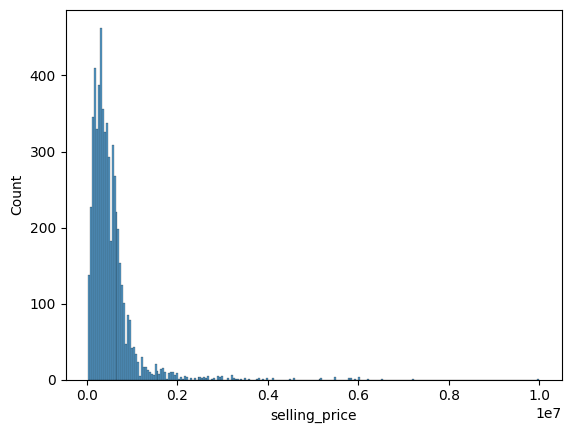

In [80]:
sns.histplot(y_train)

In [81]:
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

model = LinearRegression()
model.fit(X_train_tuned, y_train_log)

train_pred = np.exp(model.predict(X_train_tuned))
test_pred = np.exp(model.predict(X_test_tuned))

print_statistics(y_train, y_test, train_pred, test_pred)

Train R2: 0.896
Test R2: 0.915
Train MSE: 29668413652.916
Test MSE: 49039739637.772


Видно, что мы значительно прибавили в качестве, значит это улучшение мы оставляем.

Теперь добавим новый признак, лошадинная сила на объем двигателя.

In [82]:
X_train_tuned["hp_per_liter"] = X_train_tuned["max_power"] / X_train_tuned["engine"]
X_test_tuned["hp_per_liter"] = X_test_tuned["max_power"] / X_test_tuned["engine"]

In [83]:
model.fit(X_train_tuned, y_train_log)

train_pred = np.exp(model.predict(X_train_tuned))
test_pred = np.exp(model.predict(X_test_tuned))

print_statistics(y_train, y_test, train_pred, test_pred)

Train R2: 0.896
Test R2: 0.915
Train MSE: 29808190774.612
Test MSE: 48965186545.749


Немного вырос Train MSE и упал Test MSE, но в качестве сильно не прибавили.

Смотря на pairplot зависимость для таргета от года, можно заметить квадратичную форму. Попробуем сделать новый признак $year^2$.

In [179]:
X_train_tuned['year_sq'] = X_train_tuned['year'] ** 2
X_test_tuned['year_sq'] = X_test_tuned['year'] ** 2

In [182]:
model.fit(X_train_tuned, y_train_log)

train_pred = np.exp(model.predict(X_train_tuned))
test_pred = np.exp(model.predict(X_test_tuned))

print_statistics(y_train, y_test, train_pred, test_pred)

Train R2: 0.892
Test R2: 0.925
Train MSE: 31041388912.806
Test MSE: 43077100302.801


Видим, что ценой небольшой просадки $R^2$ на обучающей выборке, мы еще больше подняли метрику на тестовой. Снижение на обучающей - это нормально, потому что у нас добавились новые фичи, повышается обобщающая способность модели и она меньше подгоняется под тестовые данные.

Попробуем посмотреть на распределения числовых признаков еще раз. Проверим есть ли среди них такие, которые подобно таргет переменной можно было бы прологорифмировать.

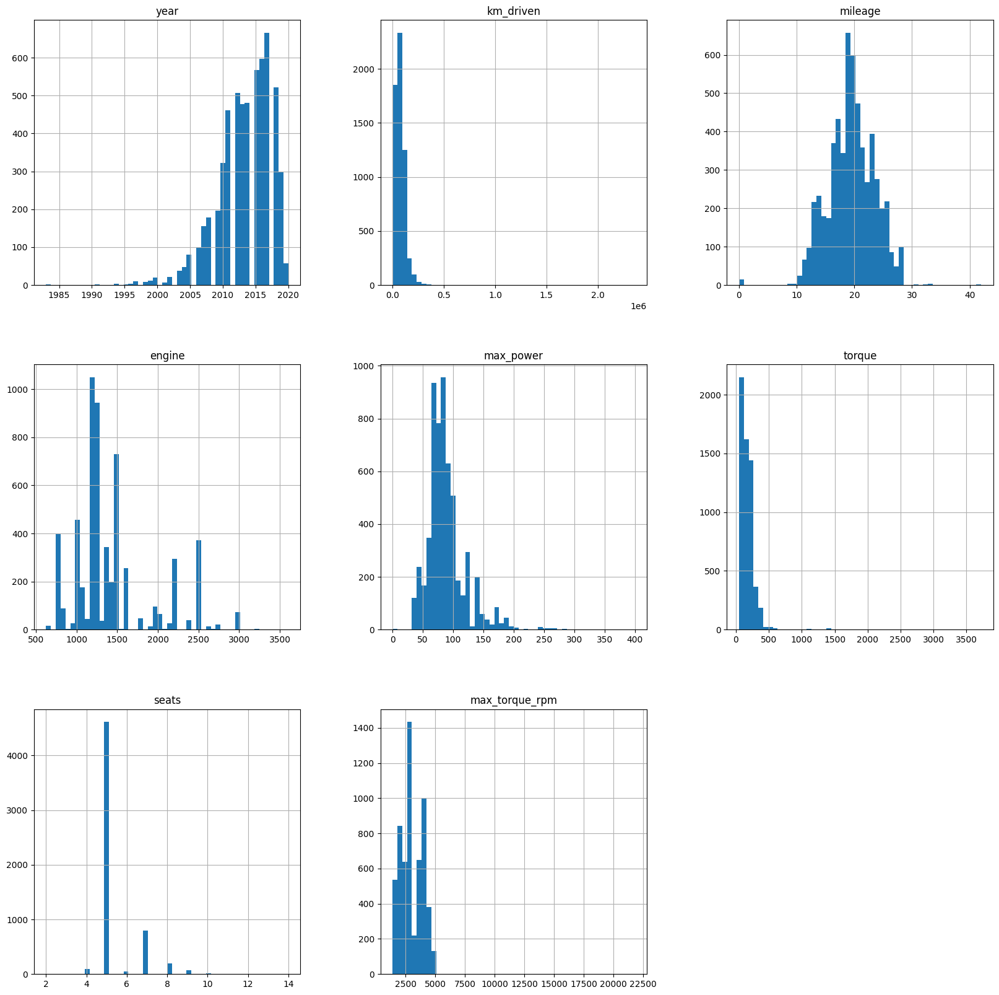

In [86]:
numeric_cols = X_train.select_dtypes(include=[int, float]).columns

X_train[numeric_cols].hist(bins=50, figsize=(20, 20))
plt.show()

По графикам видна схожая ситуация для признаков: km_driven, max_power, torque, engine, max_torque_rpm. Для seats тоже ситуация похожа, однако мы их уже кодируем, как категориальный признак в новом датасете, так что их пропустим. Используем способ преобразования Йео-Джонсона, чтобы обрабатывать отрицательные значения и приближать распределения к нормальному.

In [87]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method='yeo-johnson')

for col in ['km_driven', 'max_power', 'torque', 'engine', 'max_torque_rpm']:
    X_train_tuned[col + "_yj"] = pt.fit_transform(X_train_tuned[[col]])
    X_test_tuned[col + "_yj"] = pt.fit_transform(X_test_tuned[[col]])

In [88]:
model.fit(X_train_tuned, y_train_log)

train_pred = np.exp(model.predict(X_train_tuned))
test_pred = np.exp(model.predict(X_test_tuned))

print_statistics(y_train, y_test, train_pred, test_pred)

Train R2: 0.904
Test R2: 0.916
Train MSE: 27561129090.590
Test MSE: 48294175778.942


Логарифмирование признаков ухудшило метрику на тесте, что плохо. Но можем попробовать на этих данных обучить Elastic Net, возможно с регуляризацией у нас результат улучшится. Если же нет, то эти изменения брать не будем.

In [89]:
grid_search_params = {
    'alpha': np.logspace(-6, 2, 10),
    'l1_ratio': np.linspace(0.1, 0.9, 9),
    'max_iter': np.linspace(1000, 5000, 4).astype(int),
    'tol': np.logspace(-6, -2, 4),
}


grid_elastic = GridSearchCV(
    estimator=elastic,
    param_grid=grid_search_params,
    cv=4,
    scoring='r2',
    n_jobs=-1
)

grid_elastic.fit(X_train_tuned, y_train_log)

GridSearchCV(cv=4, estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': array([1.00000000e-06, 7.74263683e-06, 5.99484250e-05, 4.64158883e-04,
       3.59381366e-03, 2.78255940e-02, 2.15443469e-01, 1.66810054e+00,
       1.29154967e+01, 1.00000000e+02]),
                         'l1_ratio': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_iter': array([1000, 2333, 3666, 5000]),
                         'tol': array([1.00000000e-06, 2.15443469e-05, 4.64158883e-04, 1.00000000e-02])},
             scoring='r2')

In [90]:
best_elastic_model = grid_elastic.best_estimator_

train_pred = np.exp(best_elastic_model.predict(X_train_tuned))
test_pred = np.exp(best_elastic_model.predict(X_test_tuned))

print_statistics(y_train, y_test, train_pred, test_pred)

Train R2: 0.890
Test R2: 0.887
Train MSE: 31607185568.717
Test MSE: 64956392124.632


Видим, что даже с регуляризацией качество не выросло, так что идею с преобразованием признаков через Йео-Джонсона откатываем.

In [91]:
X_train_tuned.drop(columns=['km_driven_yj', 'max_power_yj',
                          'torque_yj', 'engine_yj', 'max_torque_rpm_yj'],
                  inplace=True)
X_test_tuned.drop(columns=['km_driven_yj', 'max_power_yj',
                          'torque_yj', 'engine_yj', 'max_torque_rpm_yj'],
                  inplace=True)

In [92]:
model.fit(X_train_tuned, y_train_log)

train_pred = np.exp(model.predict(X_train_tuned))
test_pred = np.exp(model.predict(X_test_tuned))

print_statistics(y_train, y_test, train_pred, test_pred)

Train R2: 0.892
Test R2: 0.925
Train MSE: 31041388912.806
Test MSE: 43077100302.801


Наконец попробуем поработать с выбросами.

In [93]:
def winsorize(series: pd.Series, p: float = 0.01):
    low = series.quantile(p)
    high = series.quantile(1-p)
    return np.clip(series, low, high)

In [94]:
numeric_cols = list(numeric_cols.values)
numeric_cols.remove('seats')

In [95]:
exp_train = X_train_tuned.copy()
exp_test = X_test_tuned.copy()

for col in numeric_cols:
    exp_train[col] = winsorize(X_train_tuned[col])
    exp_test[col] = winsorize(X_test_tuned[col])

In [96]:
model.fit(exp_train, y_train_log)

train_pred = np.exp(model.predict(exp_train))
test_pred = np.exp(model.predict(exp_test))

print_statistics(y_train, y_test, train_pred, test_pred)

Train R2: 0.865
Test R2: 0.916
Train MSE: 38655954039.475
Test MSE: 48232625069.736


Обрезание по перцентилям нам тоже не помогло. Предположительно выбросы важны для описания выборки, так что это изменение не используем.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [105]:
def business_metric(y_true: pd.Series, y_pred: pd.Series, threshold=0.1):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    rel_error = np.abs(y_pred - y_true) / y_true

    return np.mean(rel_error <= threshold)

In [106]:
y_train_pred = LR_model.predict(X_train)
y_test_pred = LR_model.predict(X_test)

print("LR train:", business_metric(y_train, y_train_pred))
print("LR test:", business_metric(y_test, y_test_pred))

y_train_pred = best_lasso_model.predict(X_train_scaled)
y_test_pred = best_lasso_model.predict(X_test_scaled)

print("Lasso train:", business_metric(y_train, y_train_pred))
print("Lasso test:", business_metric(y_test, y_test_pred))

y_train_pred = best_ridge_model.predict(X_train_cat)
y_test_pred = best_ridge_model.predict(X_test_cat)

print("Ridge train:", business_metric(y_train, y_train_pred))
print("Ridge test:", business_metric(y_test, y_test_pred))

y_train_pred = np.exp(model.predict(X_train_tuned))
y_test_pred = np.exp(model.predict(X_test_tuned))

print("Tuned model train:", business_metric(y_train, y_train_pred))
print("Tuned model test:", business_metric(y_test, y_test_pred))

LR train: 0.21695205479452054
LR test: 0.24
Lasso train: 0.22003424657534246
Lasso test: 0.242
Ridge train: 0.27551369863013697
Ridge test: 0.305
Tuned model train: 0.3327054794520548
Tuned model test: 0.347


Лучше всего с прогнозами справляются затюниная модель LR.

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [107]:
def your_business_metrics(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    rel_error = (y_pred - y_true) / y_true

    penalties = np.where(
        rel_error < 0,
        np.abs(rel_error) * 2,
        np.abs(rel_error)
    )

    return 1 - penalties.mean()

In [108]:
y_train_pred = LR_model.predict(X_train)
y_test_pred = LR_model.predict(X_test)

print("LR train:", your_business_metrics(y_train, y_train_pred))
print("LR test:", your_business_metrics(y_test, y_test_pred))

y_train_pred = best_lasso_model.predict(X_train_scaled)
y_test_pred = best_lasso_model.predict(X_test_scaled)

print("Lasso train:", your_business_metrics(y_train, y_train_pred))
print("Lasso test:", your_business_metrics(y_test, y_test_pred))

y_train_pred = best_ridge_model.predict(X_train_cat)
y_test_pred = best_ridge_model.predict(X_test_cat)

print("Ridge train:", your_business_metrics(y_train, y_train_pred))
print("Ridge test:", your_business_metrics(y_test, y_test_pred))

y_train_pred = np.exp(model.predict(X_train_tuned))
y_test_pred = np.exp(model.predict(X_test_tuned))

print("Tuned model train:", your_business_metrics(y_train, y_train_pred))
print("Tuned model test:", your_business_metrics(y_test, y_test_pred))

LR train: 0.04478875779517222
LR test: 0.03213384041974565
Lasso train: 0.050905317852688925
Lasso test: 0.036572045267370235
Ridge train: 0.3307857473050121
Ridge test: 0.34665779704868305
Tuned model train: 0.7140076715098154
Tuned model test: 0.7223848233270966


Согласно этой метрики гораздо лучше остальных с задачей вновь справляется подтюненная LR.

Теперь составим пайплайн, для того чтобы финальную модель можно было сохранить и воспроизвести все шаги с сырым датасетом

In [195]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')
df_train = df_train.drop_duplicates(subset=train_features_cols, keep='first').reset_index(drop=True)
df_test = df_test.drop_duplicates(subset=train_features_cols, keep='first').reset_index(drop=True)
y_train = df_train['selling_price']
y_test = df_test['selling_price']

In [196]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer

class CleanFeatures(BaseEstimator, TransformerMixin):
    def __init__(self, clean_func, median_cols):
        self.clean_func = clean_func
        self.median_cols = median_cols

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()
        X = self.clean_func(X)
        medians = X[self.median_cols].median()

        for i in medians.index:
            X[i] = X[i].fillna(medians[i])

        X["engine"] = X["engine"].astype(int)
        X["seats"] = X["seats"].astype(int)

        return X

class ExtractBrand(BaseEstimator, TransformerMixin):
    def __init__(self, brand_func):
        self.brand_func = brand_func

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()
        X["brand"] = X["name"].apply(self.brand_func)
        X.drop(columns=["name"], inplace=True)
        return X

class FeatureEngineering(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()
        X["hp_per_liter"] = X["max_power"] / X["engine"]
        X["year_sq"] = X["year"] ** 2
        return X

num_features = [
    "year", "km_driven", "mileage", "engine", "max_power",
    "torque", "max_torque_rpm", "hp_per_liter", "year_sq"
]

cat_features = ["brand", "seller_type", "fuel", "transmission", "owner", "seats"]

median_cols = ['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


preprocess = ColumnTransformer(
    [
        ("num", StandardScaler(), num_features),
        ("cat", OneHotEncoder(drop="first", handle_unknown="ignore"), cat_features)
    ]
)

full_pipeline = Pipeline([
    ("clean", CleanFeatures(clean_features_content, median_cols)),
    ("brand", ExtractBrand(extract_brand)),
    ("fe", FeatureEngineering()),
    ("prep", preprocess),
    ("model", LinearRegression())
])


In [197]:
y_train_log = np.log(df_train["selling_price"])

full_pipeline.fit(df_train, y_train_log)

train_pred = np.exp(full_pipeline.predict(df_train))
test_pred = np.exp(full_pipeline.predict(df_test))

print_statistics(y_train, y_test, train_pred, test_pred)


Train R2: 0.914
Test R2: 0.907
Train MSE: 24688615742.827
Test MSE: 33464971359.112


/usr/local/lib/python3.12/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [198]:
import pickle

with open("LR_model.pkl", "wb") as f:
    pickle.dump(full_pipeline, f)


# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.
